<a href="https://colab.research.google.com/github/farhanwew/Digital-Image-processing/blob/main/C4L_Morphological_Image_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 Download Data

In [ ]:
! git clone https://github.com/coderforlife/c4l-image-dataset.git

Cloning into 'c4l-image-dataset'...
remote: Enumerating objects: 1258, done.
remote: Total 1258 (delta 0), reused 0 (delta 0), pack-reused 1258 (from 1)
Receiving objects: 100% (1258/1258), 104.79 MiB | 18.47 MiB/s, done.
Resolving deltas: 100% (25/25), done.
Updating files: 100% (1209/1209), done.


Import Library

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Morphological Image Processing

Morphological image processing adalah  teknik dalam pengolahan citra digital yang berfokus pada bentuk atau struktur objek dalam gambar, terutama gambar biner (hitam-putih) atau grayscale. Teknik ini  digunakan untuk analisis bentuk, segmentasi, dan ekstraksi fitur.

Citra biner dapat mengandung banyak ketidaksempurnaan.

Misalnya, citra biner yang dihasilkan oleh thresholding sederhana mungkin terdistorsi oleh derau
(noise) dan tekstur.

Pemrosesan citra morfologis bertujuan untuk menghilangkan ketidaksempurnaan ini dengan
memperhitungkan bentuk dan struktur citra.

Morphological image processing menggunakan struktur elemen (structuring element) untuk memproses gambar. Struktur elemen ini adalah matriks kecil ( berbentuk kotak, lingkaran, atau salib) yang digunakan untuk menelusuri citra dan memodifikasi piksel berdasarkan neighborrnya.

Beberapa operasi morfologi memeriksa apakah elemen struktur **cocok (fit)** sepenuhnya dengan area gambar, sementara operasi lainnya hanya memeriksa apakah elemen tersebut **mengenai (hit)** atau beririsan sebagian dengan area tersebut.


# Fit dan Hit
**Fit**: Elemen struktur cocok jika semua piksel bernilai 1 di elemen struktur berada di atas piksel gambar yang juga bernilai 1.

**Hit**: Elemen struktur mengenai jika setidaknya satu piksel bernilai 1 di elemen struktur berada di atas piksel gambar yang bernilai 1.

# Dilation

Dilasi adalah operasi morfologi pada citra biner yang berfungsi untuk memperbesar atau menebalkan objek (piksel bernilai 1) dalam gambar.

Dilasi menambahkan piksel di tepi objek, sehingga bentuk objek menjadi lebih besar.

Tujuan:
- Mengisi celah kecil.

- Menyambungkan bagian objek yang terputus.

- Menebalkan garis atau bentuk.


Jika setidaknya satu piksel 1 di elemen struktur bertemu piksel 1 di gambar (hit), maka pusat elemen struktur akan diisi dengan 1.

---

![link text](https://towardsdatascience.com/wp-content/uploads/2022/03/1GcufLGivTUHf-wDic2GeVw-768x295.png)


[source image ](https://towardsdatascience.com/understanding-morphological-image-processing-and-its-operations-7bcf1ed11756/)




## Dilation A

- In this problem, read the image data. Convert it into a binary image.

- Use the dilation operation on this image with two different structuring elements (square and circle).

- This size of structuring element is of your choice.

- Save your results as square-cirlce-1.png and square-circle-2.png.

- Compare and contrast your results.

- Explain your observations.

In [ ]:
image_path = '/content/c4l-image-dataset/512x512/brick wall.png'

In [ ]:
img = cv2.imread(image_path)

image shape: (512, 512, 3)


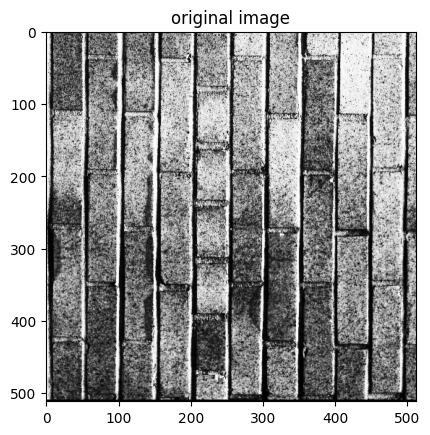

In [ ]:
print('image shape:',img.shape)
plt.title('original image')
plt.imshow(img)

image shape: (512, 512)


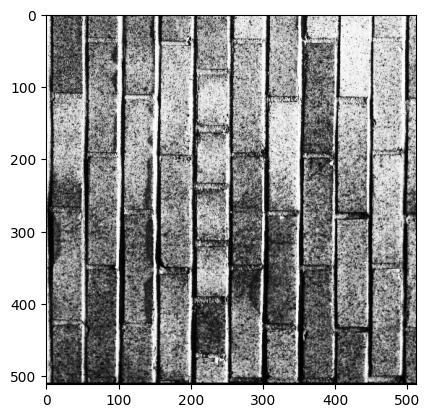

In [ ]:
img_graycale = cv2.imread(image_path, 0)
print('image shape:',img_graycale.shape)
plt.imshow(img_graycale, cmap='gray')

In [ ]:
# Ubah ke binary
threshold_value = 117
_, binary_img = cv2.threshold(img, threshold_value, 255, cv2.THRESH_BINARY)

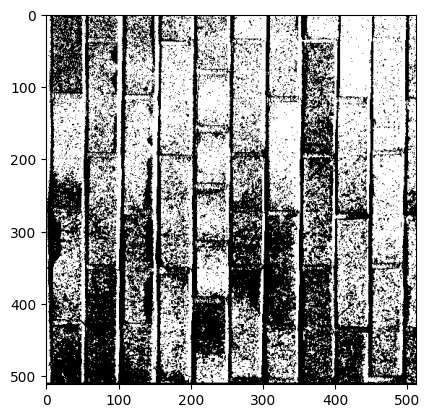

In [ ]:
plt.imshow(binary_img)

Buat structuring element

In [ ]:
square_se = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))

circle_se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))

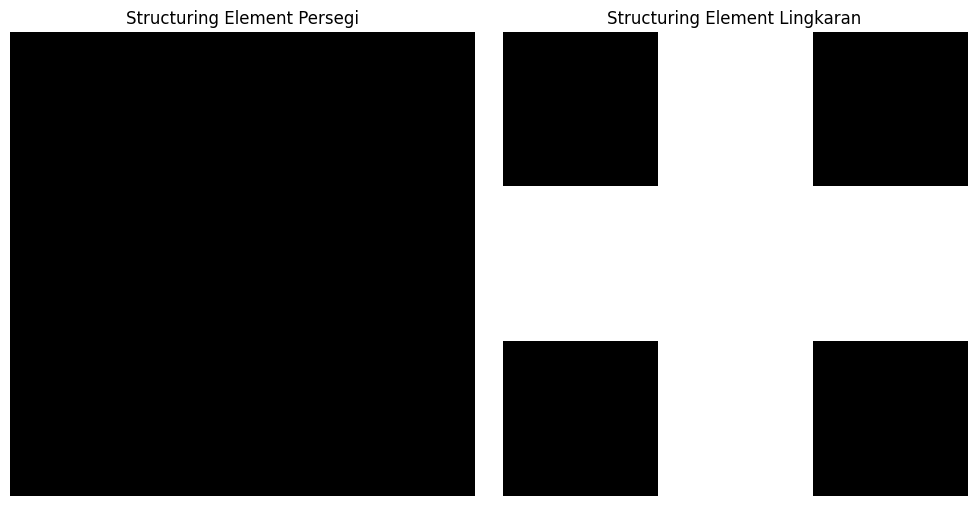

Structuring Element Persegi (5x5):
[[1 1 1]
 [1 1 1]
 [1 1 1]]

Structuring Element Lingkaran (5x5):
[[0 1 0]
 [1 1 1]
 [0 1 0]]


In [ ]:
# Tampilkan structuring element untuk referensi
plt.figure(figsize=(10, 5))

# Tampilkan structuring element persegi
plt.subplot(121)
plt.imshow(square_se * 255, cmap='gray')
plt.title('Structuring Element Persegi')
plt.axis('off')

# Tampilkan structuring element lingkaran
plt.subplot(122)
plt.imshow(circle_se * 255, cmap='gray')
plt.title('Structuring Element Lingkaran')
plt.axis('off')

plt.tight_layout()
plt.savefig('structuring-elements.png')
plt.show()

# Print bentuk structuring element untuk pemahaman lebih baik
print("Structuring Element Persegi (5x5):")
print(square_se)
print("\nStructuring Element Lingkaran (5x5):")
print(circle_se)

dilation

In [ ]:
# dilation operation with square kernel
dilated_square = cv2.dilate(binary_img, square_se, iterations=1)

# dilation operation with square circle
dilated_circle = cv2.dilate(binary_img, circle_se, iterations=1)

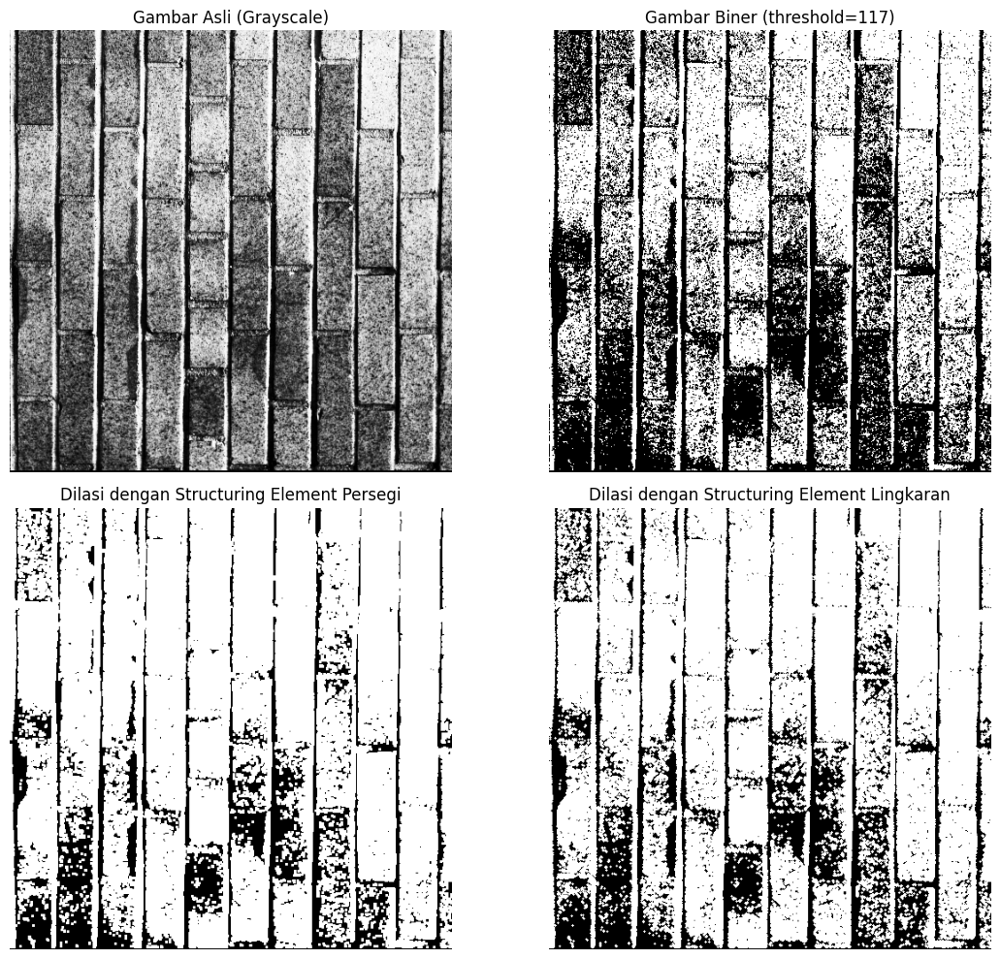

In [ ]:
# Tampilkan hasil
plt.figure(figsize=(12, 10))

# Gambar asli
plt.subplot(221)
plt.imshow(img, cmap='gray')
plt.title('Gambar Asli (Grayscale)')
plt.axis('off')

# Gambar biner setelah thresholding
plt.subplot(222)
plt.imshow(binary_img, cmap='gray')
plt.title(f'Gambar Biner (threshold={threshold_value})')
plt.axis('off')

# Hasil dilasi dengan structuring element persegi
plt.subplot(223)
plt.imshow(dilated_square, cmap='gray')
plt.title('Dilasi dengan Structuring Element Persegi')
plt.axis('off')

# Hasil dilasi dengan structuring element lingkaran
plt.subplot(224)
plt.imshow(dilated_circle, cmap='gray')
plt.title('Dilasi dengan Structuring Element Lingkaran')
plt.axis('off')

plt.tight_layout()

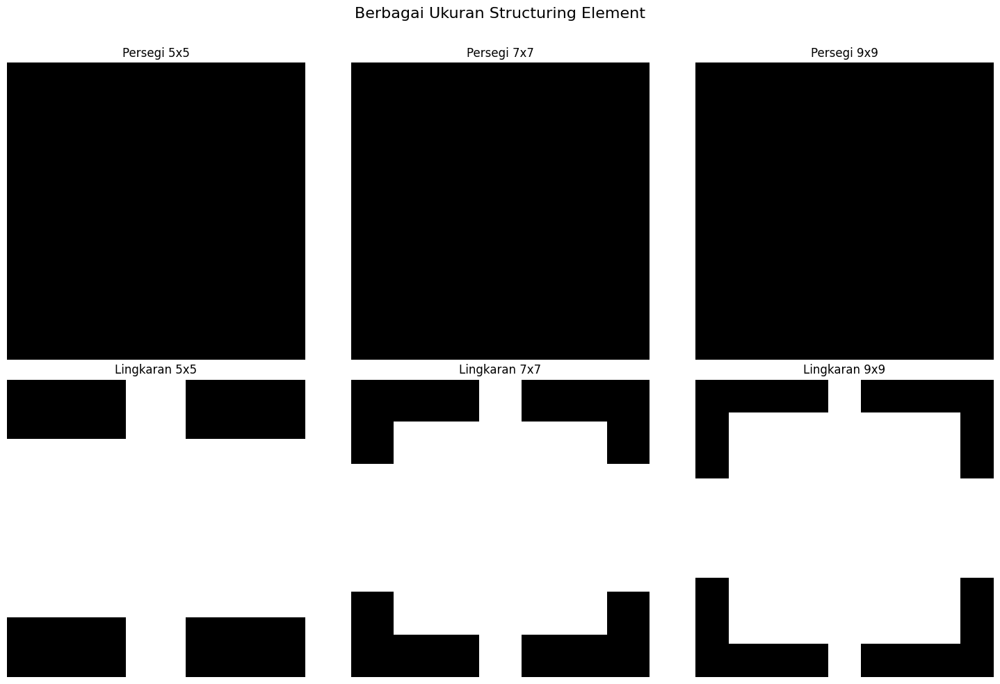

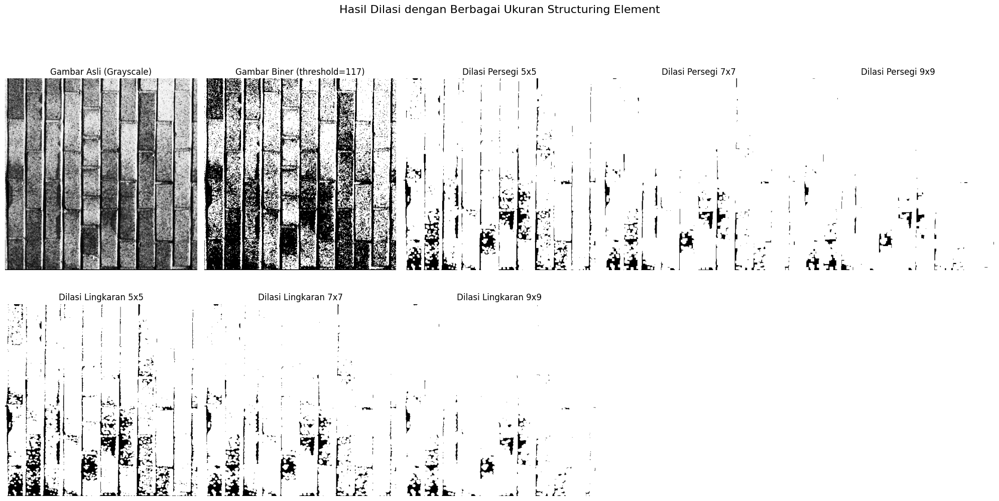

In [ ]:
# Mendefinisikan berbagai ukuran untuk eksperimen
sizes = [5, 7, 9]

# Subplot untuk menampilkan semua structuring element
plt.figure(figsize=(15, 10))
plt.suptitle("Berbagai Ukuran Structuring Element", fontsize=16)

# Membuat subplot grid untuk structuring element
for i, size in enumerate(sizes):
    # Persegi
    square_se = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))
    plt.subplot(2, len(sizes), i+1)
    plt.imshow(square_se * 255, cmap='gray')
    plt.title(f'Persegi {size}x{size}')
    plt.axis('off')

    # Lingkaran
    circle_se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (size, size))
    plt.subplot(2, len(sizes), i+1+len(sizes))
    plt.imshow(circle_se * 255, cmap='gray')
    plt.title(f'Lingkaran {size}x{size}')
    plt.axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.savefig('structuring-elements-comparison.png')
plt.show()

# Menerapkan dilasi dengan semua structuring element
# Menyiapkan plot untuk hasil dilasi
plt.figure(figsize=(20, 15))
plt.suptitle("Hasil Dilasi dengan Berbagai Ukuran Structuring Element", fontsize=16)

# Menampilkan gambar asli dan gambar biner
plt.subplot(3, len(sizes) + 2, 1) # Changed to accommodate more subplots
plt.imshow(img, cmap='gray')
plt.title('Gambar Asli (Grayscale)')
plt.axis('off')

plt.subplot(3, len(sizes) + 2, 2) # Changed to accommodate more subplots
plt.imshow(binary_img, cmap='gray')
plt.title(f'Gambar Biner (threshold={threshold_value})')
plt.axis('off')

# Menerapkan dan menampilkan dilasi dengan persegi
subplot_idx = 3
for i, size in enumerate(sizes):
    # Persegi
    square_se = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))
    dilated_square = cv2.dilate(binary_img, square_se, iterations=1)

    plt.subplot(3, len(sizes) + 2, subplot_idx) # Changed to accommodate more subplots
    plt.imshow(dilated_square, cmap='gray')
    plt.title(f'Dilasi Persegi {size}x{size}')
    plt.axis('off')

    # Simpan hasil
    cv2.imwrite(f'square-dilation-{size}x{size}.png', dilated_square)

    subplot_idx += 1

# Menerapkan dan menampilkan dilasi dengan lingkaran
for i, size in enumerate(sizes):
    # Lingkaran
    circle_se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (size, size))
    dilated_circle = cv2.dilate(binary_img, circle_se, iterations=1)

    plt.subplot(3, len(sizes) + 2, subplot_idx) # Changed to accommodate more subplots
    plt.imshow(dilated_circle, cmap='gray')
    plt.title(f'Dilasi Lingkaran {size}x{size}')
    plt.axis('off')

    # Simpan hasil
    cv2.imwrite(f'circle-dilation-{size}x{size}.png', dilated_circle)

    subplot_idx += 1

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.savefig('dilation-results-comparison.png')
plt.show()

# Dilation B

- In this problem, read the image data. Convert it into a binary image.

- Add pepper noise.

- Use dilation to fill in small spurious holes (‘pepper noise’) in the image. - - Use a suitable structuring
- element to dilate this image, hence removing the noise from the image.
- The image quality may not be that great. Save your image.

- Explain your observations.

In [ ]:
def add_pepper_noise(image, amount=0.01):
    noisy = image.copy()
    num_pepper = int(amount * image.size)
    coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape]
    noisy[coords[0], coords[1]] = 0
    return noisy

noisy_image = add_pepper_noise(binary_img, 0.05)

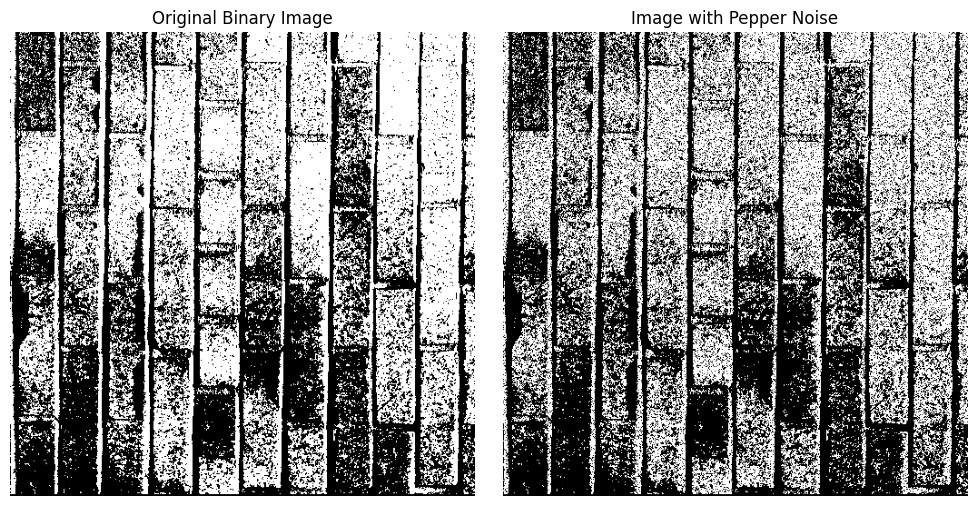

In [ ]:
# Show the image before and after pepper noise
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(binary_img, cmap='gray')
axs[0].set_title('Original Binary Image')
axs[0].axis('off')

axs[1].imshow(noisy_image, cmap='gray')
axs[1].set_title('Image with Pepper Noise')
axs[1].axis('off')

plt.tight_layout()
plt.show()

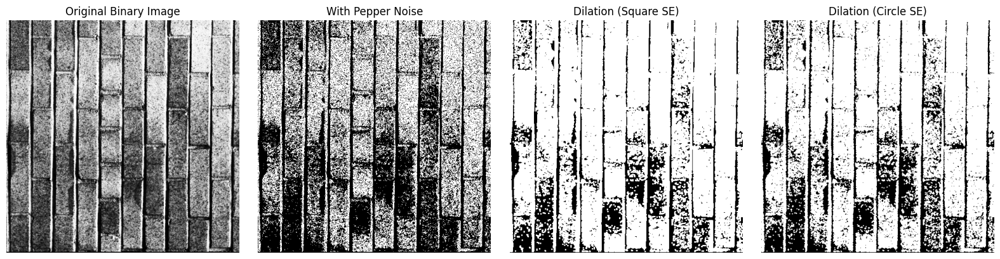

In [ ]:
# Step 3: Define structuring elements
square_se = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
circle_se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))

# Step 4: Apply dilation using square and circle structuring elements
dilated_square = cv2.dilate(noisy_image, square_se, iterations=1)
dilated_circle = cv2.dilate(noisy_image, circle_se, iterations=1)

# Step 5: Visualize the results
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
axs[0].imshow(img, cmap='gray')
axs[0].set_title("Original Binary Image")
axs[0].axis('off')

axs[1].imshow(noisy_image, cmap='gray')
axs[1].set_title("With Pepper Noise")
axs[1].axis('off')

axs[2].imshow(dilated_square, cmap='gray')
axs[2].set_title("Dilation (Square SE)")
axs[2].axis('off')

axs[3].imshow(dilated_circle, cmap='gray')
axs[3].set_title("Dilation (Circle SE)")
axs[3].axis('off')

plt.tight_layout()
plt.show()

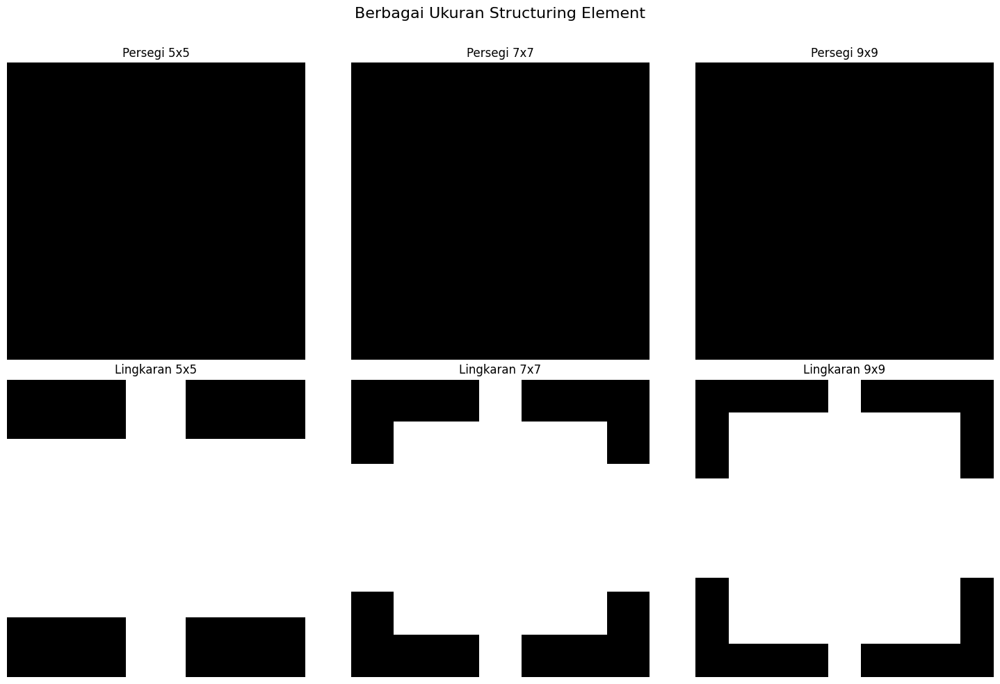

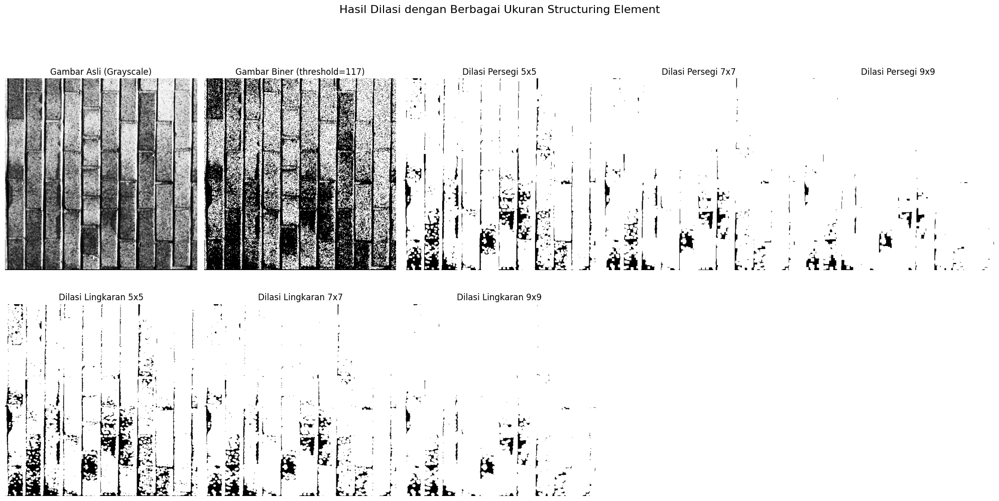

In [ ]:
# Mendefinisikan berbagai ukuran untuk eksperimen
sizes = [5, 7, 9]

# Subplot untuk menampilkan semua structuring element
plt.figure(figsize=(15, 10))
plt.suptitle("Berbagai Ukuran Structuring Element", fontsize=16)

# Membuat subplot grid untuk structuring element
for i, size in enumerate(sizes):
    # Persegi
    square_se = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))
    plt.subplot(2, len(sizes), i+1)
    plt.imshow(square_se * 255, cmap='gray')
    plt.title(f'Persegi {size}x{size}')
    plt.axis('off')

    # Lingkaran
    circle_se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (size, size))
    plt.subplot(2, len(sizes), i+1+len(sizes))
    plt.imshow(circle_se * 255, cmap='gray')
    plt.title(f'Lingkaran {size}x{size}')
    plt.axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.savefig('structuring-elements-comparison.png')
plt.show()

# Menerapkan dilasi dengan semua structuring element
# Menyiapkan plot untuk hasil dilasi
plt.figure(figsize=(20, 15))
plt.suptitle("Hasil Dilasi dengan Berbagai Ukuran Structuring Element", fontsize=16)

# Menampilkan gambar asli dan gambar biner
plt.subplot(3, len(sizes) + 2, 1) # Changed to accommodate more subplots
plt.imshow(img, cmap='gray')
plt.title('Gambar Asli (Grayscale)')
plt.axis('off')

plt.subplot(3, len(sizes) + 2, 2) # Changed to accommodate more subplots
plt.imshow(noisy_image, cmap='gray')
plt.title(f'Gambar Biner (threshold={threshold_value})')
plt.axis('off')

# Menerapkan dan menampilkan dilasi dengan persegi
subplot_idx = 3
for i, size in enumerate(sizes):
    # Persegi
    square_se = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))
    dilated_square = cv2.dilate(noisy_image, square_se, iterations=1)

    plt.subplot(3, len(sizes) + 2, subplot_idx) # Changed to accommodate more subplots
    plt.imshow(dilated_square, cmap='gray')
    plt.title(f'Dilasi Persegi {size}x{size}')
    plt.axis('off')

    # Simpan hasil
    cv2.imwrite(f'square-dilation-{size}x{size}.png', dilated_square)

    subplot_idx += 1

# Menerapkan dan menampilkan dilasi dengan lingkaran
for i, size in enumerate(sizes):
    # Lingkaran
    circle_se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (size, size))
    dilated_circle = cv2.dilate(noisy_image, circle_se, iterations=1)

    plt.subplot(3, len(sizes) + 2, subplot_idx) # Changed to accommodate more subplots
    plt.imshow(dilated_circle, cmap='gray')
    plt.title(f'Dilasi Lingkaran {size}x{size}')
    plt.axis('off')

    # Simpan hasil
    cv2.imwrite(f'circle-dilation-{size}x{size}.png', dilated_circle)

    subplot_idx += 1

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.savefig('dilation-results-comparison.png')
plt.show()

# Erosian

Erosi adalah operasi morfologi yang berfungsi untuk mengikis atau mengecilkan objek (piksel bernilai 1) dalam citra biner.


Erosi menghapus piksel di tepi objek, sehingga bentuk objek menjadi lebih kecil atau lebih tipis.

Tujuan:
- Menghilangkan noise kecil.

- Memisahkan objek yang saling menempel.

- Mengecilkan objek.

Erosi hanya mempertahankan piksel 1 jika semua piksel bernilai 1 dalam elemen struktur sepenuhnya cocok (fit) dengan area gambar.

![link text](https://towardsdatascience.com/wp-content/uploads/2022/03/16i7JdXdnKVjkNA1pH3xZ0g-768x297.png)

[source image](https://towardsdatascience.com/wp-content/uploads/2022/03/16i7JdXdnKVjkNA1pH3xZ0g-768x297.png)

## Erosian A

In this problem, read the image data. Convert it into a binary image.

Use the erosion operation on this image with two different structuring elements (square and circle).

This size of structuring element is of your choice.

Save your results as square-cirlce-erode1.png and square-circle-erode2.png.

Compare and contrast your results.

Explain your observations.

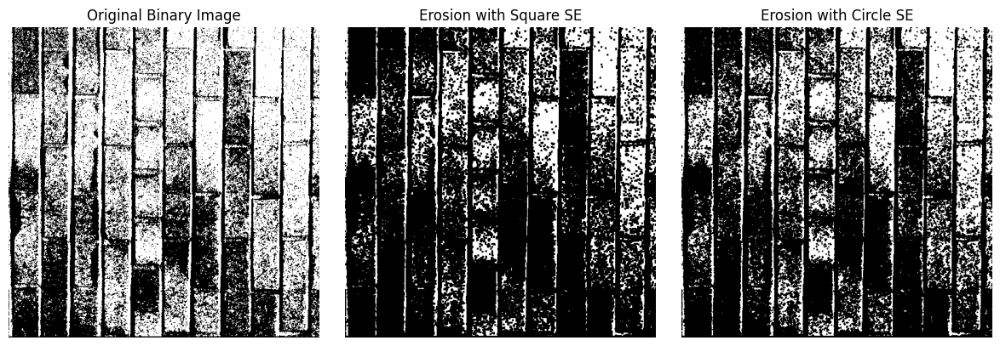

In [ ]:
square_se = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
circle_se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))

# Erosion
eroded_square = cv2.erode(binary_img, square_se)
eroded_circle = cv2.erode(binary_img, circle_se)

# Plot
fig, axs = plt.subplots(1, 3, figsize=(12, 4))
axs[0].imshow(binary_img, cmap='gray')
axs[0].set_title("Original Binary Image")
axs[0].axis('off')

axs[1].imshow(eroded_square, cmap='gray')
axs[1].set_title("Erosion with Square SE")
axs[1].axis('off')

axs[2].imshow(eroded_circle, cmap='gray')
axs[2].set_title("Erosion with Circle SE")
axs[2].axis('off')

plt.tight_layout()
plt.show()

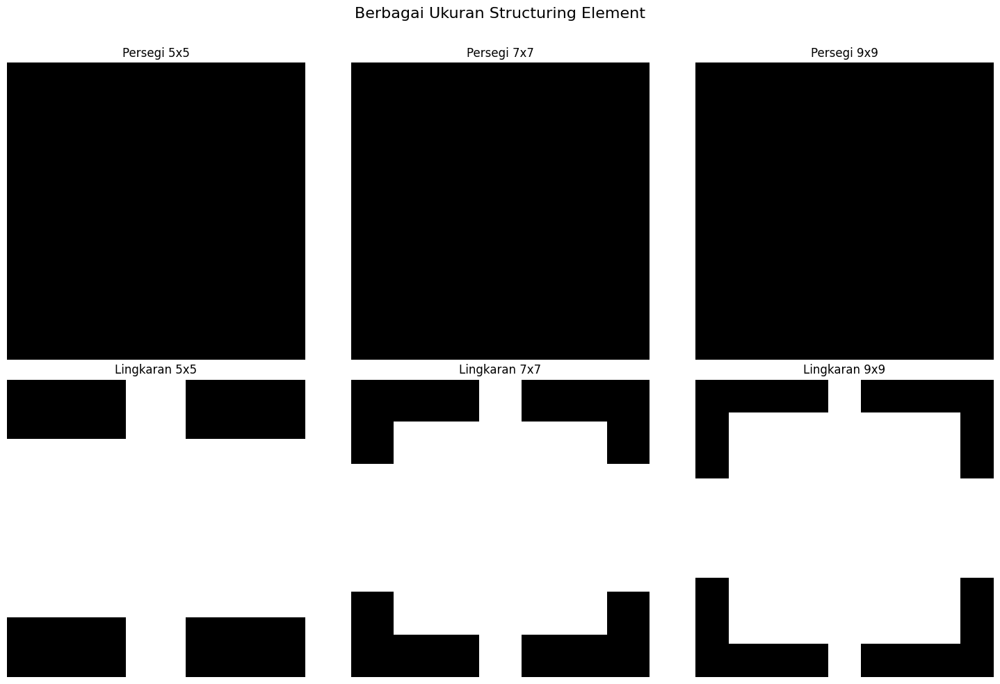

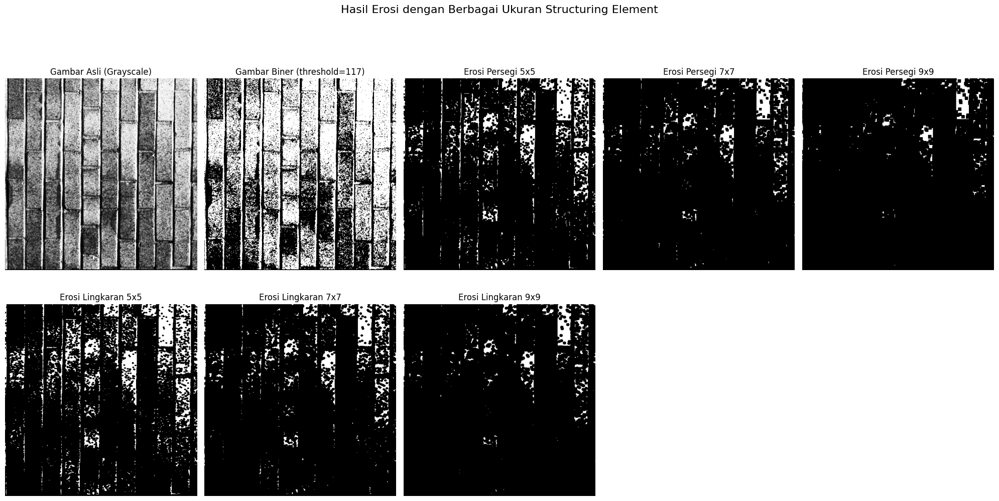

In [ ]:
# Mendefinisikan berbagai ukuran untuk eksperimen
sizes = [5, 7, 9]

# Subplot untuk menampilkan semua structuring element
plt.figure(figsize=(15, 10))
plt.suptitle("Berbagai Ukuran Structuring Element", fontsize=16)

# Membuat subplot grid untuk structuring element
for i, size in enumerate(sizes):
    # Persegi
    square_se = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))
    plt.subplot(2, len(sizes), i+1)
    plt.imshow(square_se * 255, cmap='gray')
    plt.title(f'Persegi {size}x{size}')
    plt.axis('off')

    # Lingkaran
    circle_se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (size, size))
    plt.subplot(2, len(sizes), i+1+len(sizes))
    plt.imshow(circle_se * 255, cmap='gray')
    plt.title(f'Lingkaran {size}x{size}')
    plt.axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.savefig('structuring-elements-comparison.png')
plt.show()

# Menerapkan erosi dengan semua structuring element
# Menyiapkan plot untuk hasil erosi
plt.figure(figsize=(20, 15))
plt.suptitle("Hasil Erosi dengan Berbagai Ukuran Structuring Element", fontsize=16)

# Menampilkan gambar asli dan gambar biner
plt.subplot(3, len(sizes) + 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Gambar Asli (Grayscale)')
plt.axis('off')

plt.subplot(3, len(sizes) + 2, 2)
plt.imshow(binary_img, cmap='gray')
plt.title(f'Gambar Biner (threshold={threshold_value})')
plt.axis('off')

# Menerapkan dan menampilkan erosi dengan persegi
subplot_idx = 3
for i, size in enumerate(sizes):
    square_se = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))
    eroded_square = cv2.erode(binary_img, square_se, iterations=1)

    plt.subplot(3, len(sizes) + 2, subplot_idx)
    plt.imshow(eroded_square, cmap='gray')
    plt.title(f'Erosi Persegi {size}x{size}')
    plt.axis('off')

    # Simpan hasil
    cv2.imwrite(f'square-erosion-{size}x{size}.png', eroded_square)

    subplot_idx += 1

# Menerapkan dan menampilkan erosi dengan lingkaran
for i, size in enumerate(sizes):
    circle_se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (size, size))
    eroded_circle = cv2.erode(binary_img, circle_se, iterations=1)

    plt.subplot(3, len(sizes) + 2, subplot_idx)
    plt.imshow(eroded_circle, cmap='gray')
    plt.title(f'Erosi Lingkaran {size}x{size}')
    plt.axis('off')

    # Simpan hasil
    cv2.imwrite(f'circle-erosion-{size}x{size}.png', eroded_circle)

    subplot_idx += 1

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.savefig('erosion-results-comparison.png')
plt.show()


## Erosian B

In this problem, read the image data. Convert it into a binary image.

Add salt noise.

Use erosion to reduce the salt noise in the image. Save your image.

Explain your observations.

In [ ]:
def add_pepper_noise(image, amount=0.01):
    noisy = image.copy()
    num_pepper = int(amount * image.size)
    coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape]
    noisy[coords[0], coords[1]] = 0
    return noisy

noisy_image = add_pepper_noise(binary_img, 0.05)

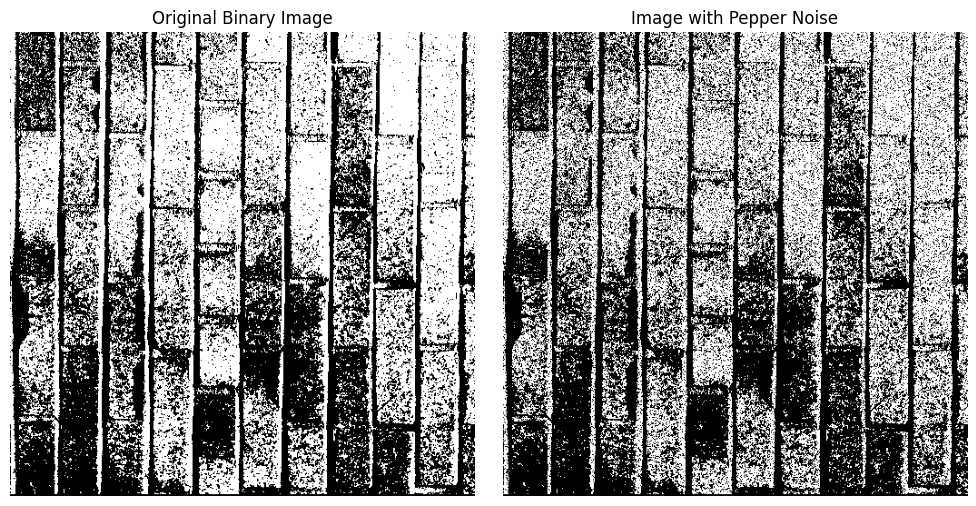

In [ ]:
# Show the image before and after pepper noise
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(binary_img, cmap='gray')
axs[0].set_title('Original Binary Image')
axs[0].axis('off')

axs[1].imshow(noisy_image, cmap='gray')
axs[1].set_title('Image with Pepper Noise')
axs[1].axis('off')

plt.tight_layout()
plt.show()

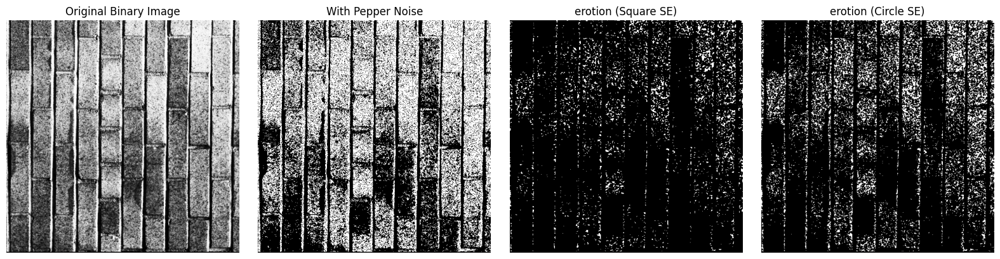

In [ ]:
# Step 3: Define structuring elements
square_se = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
circle_se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))

# Step 4: Apply dilation using square and circle structuring elements
eroded_square = cv2.erode(noisy_image, square_se, iterations=1)
eroded_circle = cv2.erode(noisy_image, circle_se, iterations=1)

# Step 5: Visualize the results
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
axs[0].imshow(img, cmap='gray')
axs[0].set_title("Original Binary Image")
axs[0].axis('off')

axs[1].imshow(noisy_image, cmap='gray')
axs[1].set_title("With Pepper Noise")
axs[1].axis('off')

axs[2].imshow(eroded_square, cmap='gray')
axs[2].set_title("erotion (Square SE)")
axs[2].axis('off')

axs[3].imshow(eroded_circle, cmap='gray')
axs[3].set_title("erotion (Circle SE)")
axs[3].axis('off')

plt.tight_layout()
plt.show()

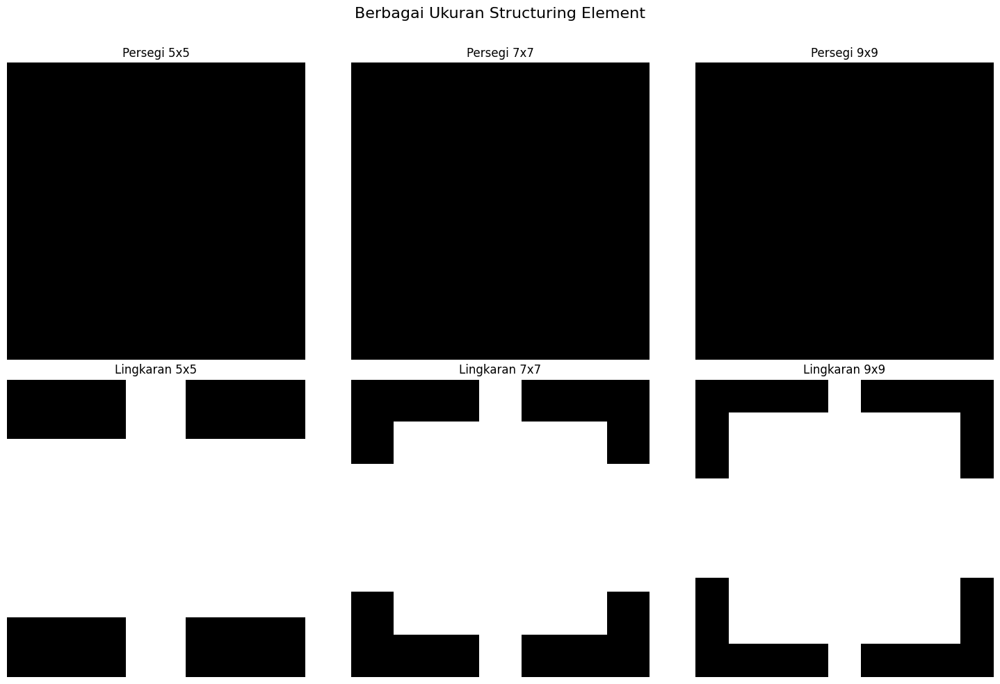

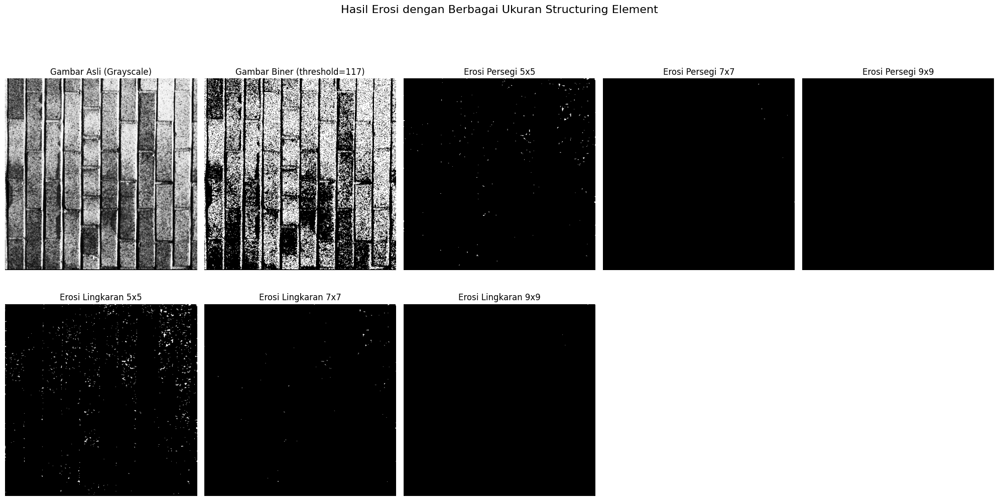

In [ ]:
# Mendefinisikan berbagai ukuran untuk eksperimen
sizes = [5, 7, 9]

# Subplot untuk menampilkan semua structuring element
plt.figure(figsize=(15, 10))
plt.suptitle("Berbagai Ukuran Structuring Element", fontsize=16)

# Membuat subplot grid untuk structuring element
for i, size in enumerate(sizes):
    # Persegi
    square_se = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))
    plt.subplot(2, len(sizes), i+1)
    plt.imshow(square_se * 255, cmap='gray')
    plt.title(f'Persegi {size}x{size}')
    plt.axis('off')

    # Lingkaran
    circle_se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (size, size))
    plt.subplot(2, len(sizes), i+1+len(sizes))
    plt.imshow(circle_se * 255, cmap='gray')
    plt.title(f'Lingkaran {size}x{size}')
    plt.axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.savefig('structuring-elements-comparison.png')
plt.show()

# Menerapkan erosi dengan semua structuring element
# Menyiapkan plot untuk hasil erosi
plt.figure(figsize=(20, 15))
plt.suptitle("Hasil Erosi dengan Berbagai Ukuran Structuring Element", fontsize=16)

# Menampilkan gambar asli dan gambar biner
plt.subplot(3, len(sizes) + 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Gambar Asli (Grayscale)')
plt.axis('off')

plt.subplot(3, len(sizes) + 2, 2)
plt.imshow(noisy_image, cmap='gray')
plt.title(f'Gambar Biner (threshold={threshold_value})')
plt.axis('off')

# Menerapkan dan menampilkan erosi dengan persegi
subplot_idx = 3
for i, size in enumerate(sizes):
    square_se = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))
    eroded_square = cv2.erode(noisy_image, square_se, iterations=1)

    plt.subplot(3, len(sizes) + 2, subplot_idx)
    plt.imshow(eroded_square, cmap='gray')
    plt.title(f'Erosi Persegi {size}x{size}')
    plt.axis('off')

    cv2.imwrite(f'square-erosion-{size}x{size}.png', eroded_square)
    subplot_idx += 1

# Menerapkan dan menampilkan erosi dengan lingkaran
for i, size in enumerate(sizes):
    circle_se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (size, size))
    eroded_circle = cv2.erode(noisy_image, circle_se, iterations=1)

    plt.subplot(3, len(sizes) + 2, subplot_idx)
    plt.imshow(eroded_circle, cmap='gray')
    plt.title(f'Erosi Lingkaran {size}x{size}')
    plt.axis('off')

    cv2.imwrite(f'circle-erosion-{size}x{size}.png', eroded_circle)
    subplot_idx += 1

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.savefig('erosion-results-comparison.png')
plt.show()

# Counting Objects

Find a suitable binary image that contains minimum two different shapes (such as circles and
squares). Use morphological operations to separate the shapes.

Create a program that can count each shape in the image.

**Transformasi Hough untuk Deteksi Garis dan Lingkaran**

---

### 1. Konsep Transformasi Hough

Transformasi Hough adalah metode dalam pengolahan citra digital untuk mendeteksi bentuk geometris, seperti garis dan lingkaran, dalam citra biner. Teknik ini memetakan piksel pada citra ke dalam suatu ruang parameter dan mencari puncak akumulasi yang mengindikasikan keberadaan suatu bentuk.

- **Untuk garis**: Representasi parametrik garis menggunakan rumus:
  $$ \rho = x \cos \theta + y \sin \theta $$
  di mana $ \rho $ adalah jarak dari titik asal ke garis, dan $ \theta $ adalah sudut garis terhadap sumbu-x.

- **Untuk lingkaran**: Lingkaran memiliki tiga parameter (x, y, r) dan memerlukan lebih banyak perhitungan atau metode berbasis edge. Dengan persamaan: $$ (x - a)^2 + (y - b)^2 = r^2 $$
di mana $(a,b)$ adalah titik pusat lingkaran dan $r$ adalah panjang jari-jari lingkaran.

### Deteksi garis dengan hough transfoirm

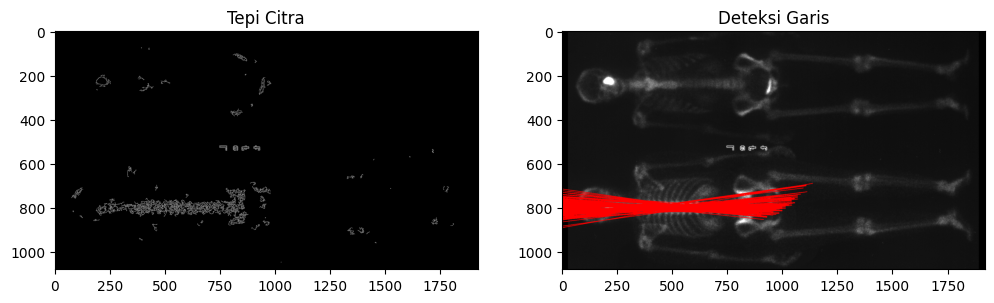

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Baca citra dan ubah ke grayscale
img = cv2.imread('/content/c4l-image-dataset/1920x1080/bone_scint.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Deteksi tepi
edges = cv2.Canny(gray, 50, 150, apertureSize=3)

# Hough Transform untuk garis
lines = cv2.HoughLines(edges, 1, np.pi / 180, 150)

# Gambar garis pada citra
img_lines = img.copy()
if lines is not None:
    for rho, theta in lines[:,0]:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(img_lines, (x1,y1), (x2,y2), (0,0,255), 2)

# Visualisasi
plt.figure(figsize=(12,6))
plt.subplot(1,2,1), plt.imshow(edges, cmap='gray'), plt.title('Tepi Citra')
plt.subplot(1,2,2), plt.imshow(cv2.cvtColor(img_lines, cv2.COLOR_BGR2RGB)), plt.title('Deteksi Garis')
plt.show()

### Deteksi lingkaran

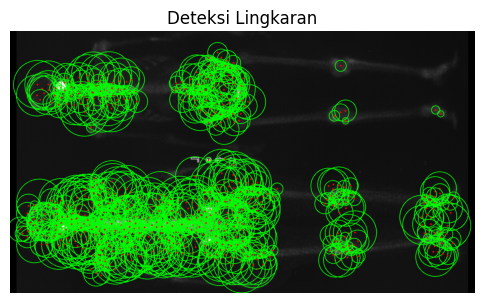

In [ ]:
# Menggunakan HoughCircles
circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, dp=1.2, minDist=20,
                           param1=50, param2=30, minRadius=5, maxRadius=100)

img_circles = img.copy()

if circles is not None:
    circles = np.uint16(np.around(circles))
    for x, y, r in circles[0, :]:
        cv2.circle(img_circles, (x, y), r, (0, 255, 0), 2)
        cv2.circle(img_circles, (x, y), 2, (0, 0, 255), 3)

# Visualisasi
plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(img_circles, cv2.COLOR_BGR2RGB))
plt.title('Deteksi Lingkaran')
plt.axis('off')
plt.show()


### Eksperimen untuk garis

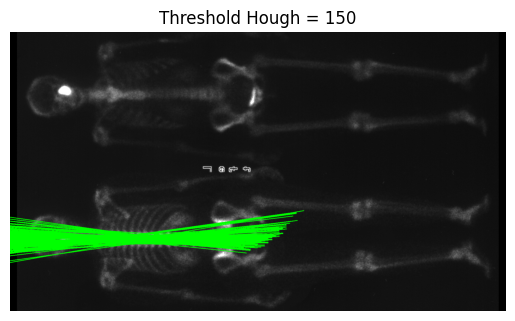

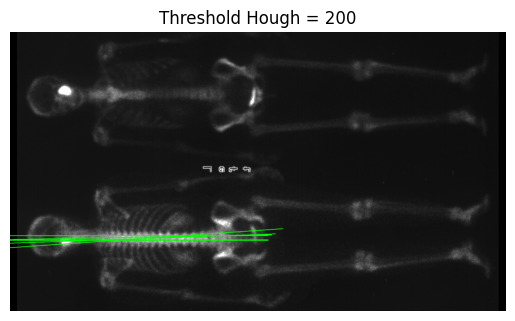

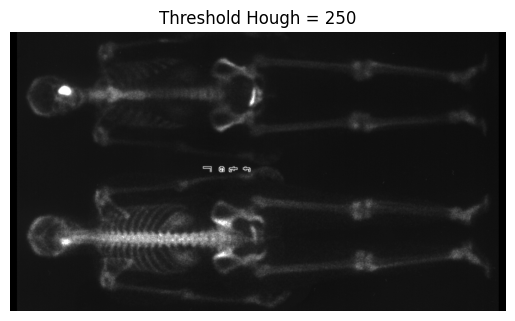

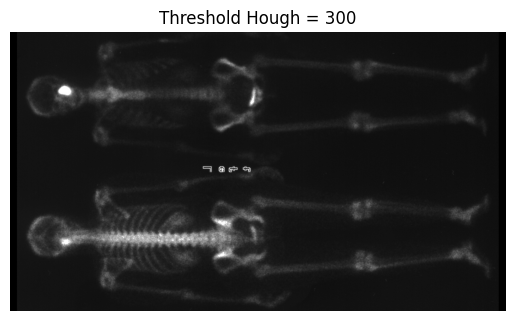

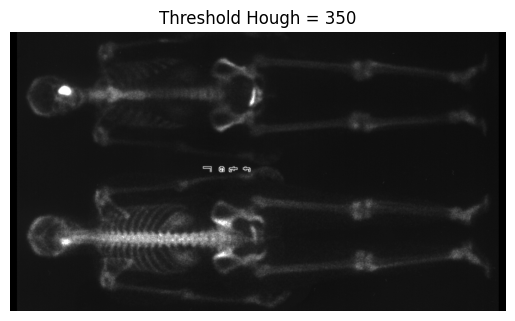

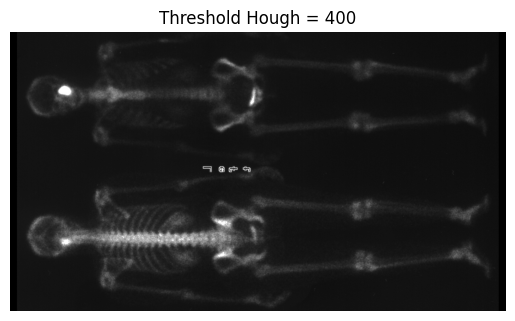

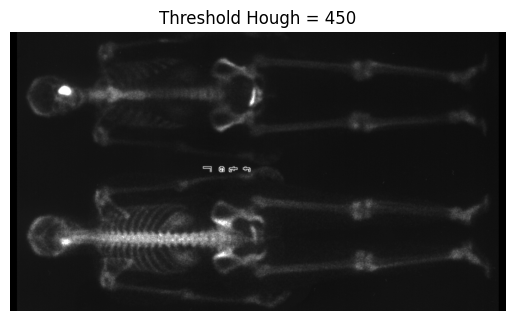

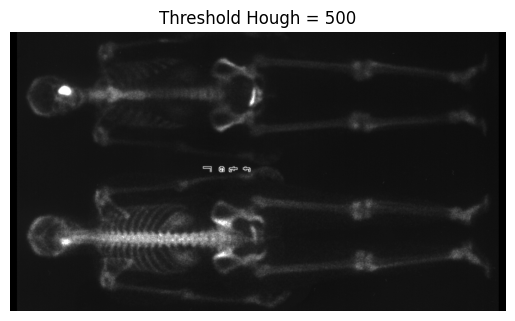

In [ ]:
for threshold in range(150, 501, 50):
    lines = cv2.HoughLines(edges, 1, np.pi / 180, threshold)
    temp_img = img.copy()
    if lines is not None:
        for line in lines:
            rho, theta = line[0]
            a = np.cos(theta)
            b = np.sin(theta)
            x0 = a * rho
            y0 = b * rho
            x1 = int(x0 + 1000 * (-b))
            y1 = int(y0 + 1000 * (a))
            x2 = int(x0 - 1000 * (-b))
            y2 = int(y0 - 1000 * (a))
            cv2.line(temp_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
    plt.figure()
    plt.imshow(cv2.cvtColor(temp_img, cv2.COLOR_BGR2RGB))
    plt.title(f'Threshold Hough = {threshold}')
    plt.axis('off')
    plt.show()

### Experimet Circle Hough

param2: ambang akumulasi minimum untuk mendeteksi lingkaran.

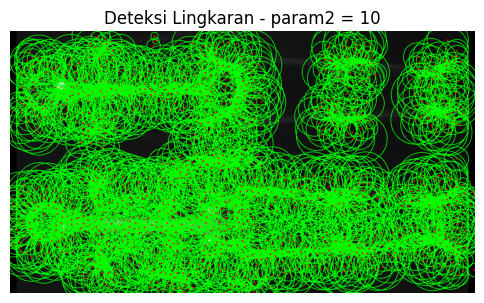

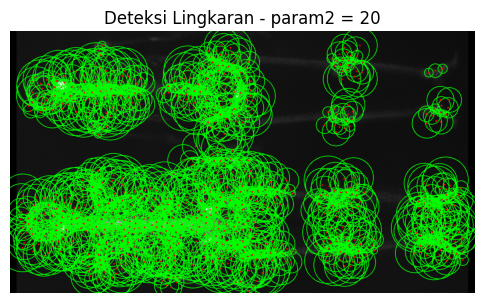

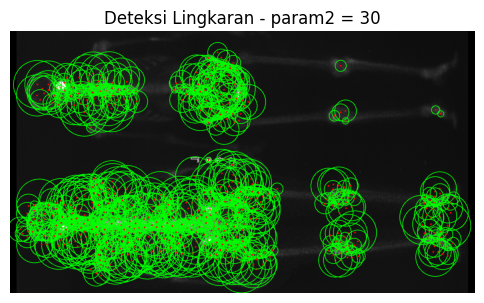

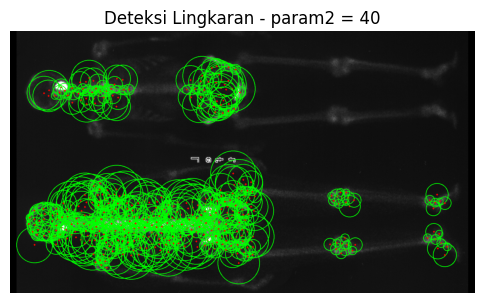

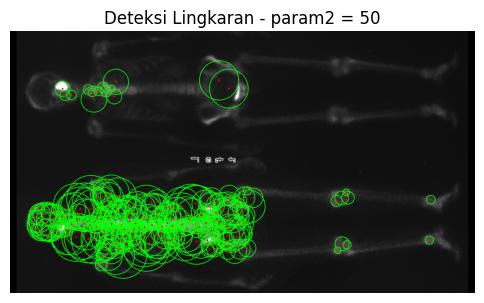

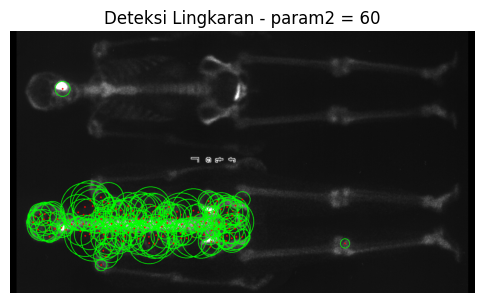

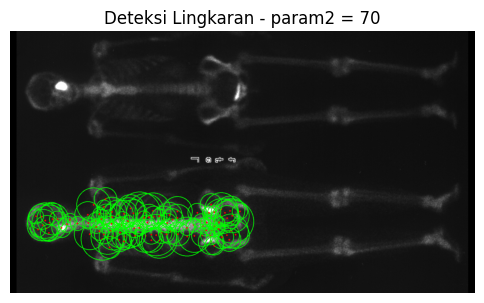

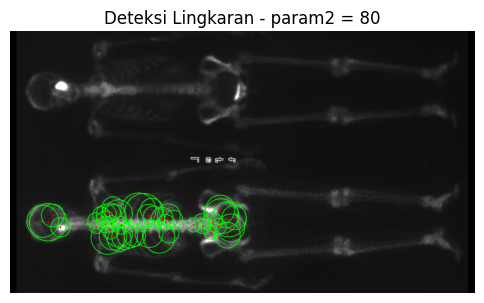

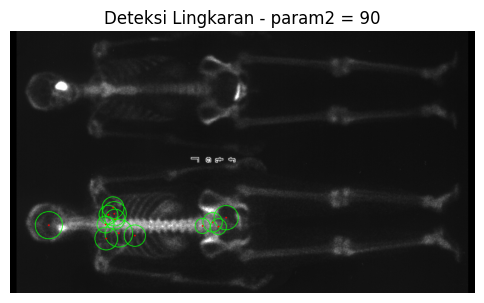

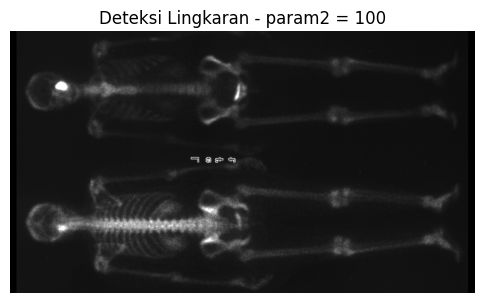

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
for param2 in range(10, 101, 10):
    circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, dp=1.2, minDist=20,
                               param1=50, param2=param2, minRadius=5, maxRadius=100)

    img_circles = img.copy()

    if circles is not None:
        circles = np.uint16(np.around(circles))
        for x, y, r in circles[0, :]:
            cv2.circle(img_circles, (x, y), r, (0, 255, 0), 2)
            cv2.circle(img_circles, (x, y), 2, (0, 0, 255), 3)

    # Visualisasi
    plt.figure(figsize=(6,6))
    plt.imshow(cv2.cvtColor(img_circles, cv2.COLOR_BGR2RGB))
    plt.title(f'Deteksi Lingkaran - param2 = {param2}')
    plt.axis('off')
    plt.show()
